In [1]:
from operator import add, truediv
from collections import Counter
from numba import njit,vectorize, prange, errors
from mpl_toolkits.axes_grid1 import make_axes_locatable

In [2]:
from matplotlib import animation, rc
from IPython.display import HTML

In [4]:
import matplotlib.pyplot as plt
import seaborn as sbn
import pandas as pd
import numpy as np
import itertools
import warnings
import random
import sys
import os

In [5]:
warnings.simplefilter('ignore', category=errors.NumbaDeprecationWarning)
warnings.simplefilter('ignore', category=errors.NumbaPendingDeprecationWarning)

In [6]:
sbn.set()

In [35]:
@njit
def random_exp_numpy(a0):
    """
    This functions generates a exponential random 
    variable with mean and std. dev. 1/a0
    """
    r = np.random.random()
    return (1/a0)*np.log(1/r)

@njit
def sum_vectors_list(a,b):
    l = []
    n = len(a)
    for i in prange(n):
        l.append(a[i]+b[i])
    return l

@njit
def sum_vect(a):
    n = len(a)
    k = 0.0
    for i in prange(n):
        k += a[i]
    return k

@njit
def div_vect(a,a0):
    n = len(a)
    b = []
    for i in prange(n):
        b.append(a[i]/a0)
    return b

@njit
def a_positive(a):
    if a>=0:
        return a
    else:
        return 0
    
def select_patch(tensor,interest_func_selection,patch_idx,n):
    A = np.sum(tensor[interest_func_selection,:,:],axis=0).reshape(n)
    return random.choices(patch_idx, weights=map(truediv,A,[sum(A)]*n))[0]

In [15]:
_=random_exp_numpy(2)
_=sum_vectors_list([1,2],[1,2])
_=sum_vect([1,2])
_=div_vect([1,2],1)
_ = a_positive(3)

# 1. Directional sensing y quimiotaxis celular. 

En (Gamba, A. et al, 2005) se propone un mecánismo para simular _directional sensing_ por medio de una red de reacciones que tiene un comportamiento estocastico. Podemos resumir las reacciones y los procesos de difusión como sigue:
$$
\begin{eqnarray}
&PI3K(cytosol) + Rec(i) & \longleftrightarrow PI3K\cdot Rec(i)  \\
&PTEN(cytosol) + PIP_{2}(i)& \longleftrightarrow PTEN\cdot PIP_{2}(i) \\
&PI3K\cdot Rec(i) +PIP_{2}(i)& \rightarrow  PI3K\cdot Rec(i)+PIP_{3}(i) \\
&PTEN\cdot PIP_{2}(i) + PIP_{3}(i)& \rightarrow PTEN\cdot PIP_{2}(i) + PIP_{2}(i) \\
&PIP_{2}(i)& \rightarrow PIP_{2}(j) \\
&PIP_{3}(i)& \rightarrow PIP_{3}(j)
\end{eqnarray}
$$

Las funciones de propensidad son las siguientes:
$$
\begin{eqnarray}
a_{0}(\cdot) &=& \displaystyle\frac{V}{N_{s}} k_{ass}^{Rec}\left[Rec\right]_{i} \left[PI3K\right]_{cyto} \\
a_{1}(\cdot) &=& \displaystyle\frac{1}{N_{s}} k_{diss}^{Rec}\left[Rec\cdot PI3K\right]_{i} \\
a_{2}(\cdot) &=& \displaystyle\frac{V}{N_{s}} k_{ass}^{PIP_{2}}\left[PIP_{2}\right]_{i}\left[PTEN \right]_{cyto} \\
a_{3}(\cdot) &=& \displaystyle\frac{1}{N_{s}} k_{diss}^{PIP_{2}}\left[PIP_{2}\cdot PTEN\right]_{i} \\
a_{4}(\cdot) &=& k_{cat}^{PI3K} \displaystyle\frac{[PI3K]_{i}[PIP_{2}]_i}{K_{M}^{PI3K} + [PIP_{3}]_{i}} \\
a_{5}(\cdot) &=& k_{cat}^{PTEN} \displaystyle\frac{[PTEN]_{i}[PIP_{3}]_i}{K_{M}^{PTEN} + [PIP_{3}]_{i}} \\
a_{6}(\cdot) &=& \displaystyle\frac{D}{\sqrt{3}S_{site}} \sum_{<i,j>}(\left[PIP_{2}\right]_{i} - \left[PIP_{2}\right]_{j})_{+} \\
a_{7}(\cdot) &=& \displaystyle\frac{D}{\sqrt{3}S_{site}} \sum_{<i,j>}(\left[PIP_{3}\right]_{i} - \left[PIP_{3}\right]_{j})_{+} \\
\end{eqnarray}
$$

Notemos que tenemos 7 especies moleculares:
1. $PI3K$
1. $Rec$
1. $PI3K\cdot Rec$
1. $PTEN$
1. $PIP_{2}$
1. $PIP_{3}$
1. $PTEN\cdot PIP_{2}$

Así pues en mismo orden tenemos los siguientes vectores de cambio de estado:

In [36]:
# v_i = [PI3K, Rec, PI3K-Rec, PTEN, PIP2, PIP3, PTEN-PIP2]
v = [
    [-1,-1,1,0,0,0,0],
    [1,1,-1,0,0,0,0],
    [0,0,0,-1,-1,0,1],
    [0,0,0,1,1,0,-1],
    [0,0,0,0,-1,1,0],
    [0,0,0,0,1,-1,0],
    [0,0,0,0,-1,0,0],
    [0,0,0,0,0,-1,0],
]

# v_i = [PI3K, Rec, PI3K-Rec, PTEN, PIP2, PIP3, PTEN-PIP2]

interest_func = [[0,1],
                 [2],
                 [3,4],
                 [6],
                 [2,4],
                 [5,6],
                 [4],
                 [5]
                ]

In [24]:
def R(M, k_rec_ass=50.0, k_rec_diss=0.1, k_pip2_ass=50.0, k_pip2_diss=0.1, k_pi3k_cat=1.0, K_pi3k_m=200.0, k_pten_cat=0.5, K_pten_m=200.0, D=0.1):
    """
    M is a tensor M.shape[0]->7
    """
    #V=4188.7902
    #Ns=10254.0
    return [
        k_rec_ass*np.sum(M[1])*np.sum(M[0]),
        k_rec_diss*np.sum(M[2]),
        k_pip2_ass*np.sum(M[4])*np.sum(M[3]),
        k_pip2_diss*np.sum(M[-1]),
        k_pi3k_cat*( (np.sum(M[0]) * np.sum(M[4])) / (K_pi3k_m + np.sum(M[4])) ),
        k_pi3k_cat*( (np.sum(M[3]) * np.sum(M[5])) / (K_pten_m + np.sum(M[5])) ),
        (1/np.sqrt(3))*D*np.sum(M[4]),
        (1/np.sqrt(3))*D*np.sum(M[5])
    ]

In [32]:
A = np.array([np.zeros((3,3))]*7)

In [33]:
R(A)

[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]

In [75]:
def SSA(M,a,interest_func,v,t_max=1,seed=42):
    
    np.random.seed(seed=42)
    
    evolM = []
    evolM.append(M)
    
    T = []
    T.append(0)
    t0 = 0
    #Jj = []
    sp = M.shape[1] #define dimension
    n = sp**2 # Define flaten dimension
    patch_idx_2d = list(itertools.product(range(sp),range(sp))) #define all the combinations of matrix entries
    patch_idx = list(range(sp**2)) #The idx of patch_idx_2d combinations
    neighb_patch = list(filter(lambda x: abs(x[0])!=abs(x[1]),itertools.product(range(-1,2),range(-1,2)))) # The valid neighbors
    idx = list(range(len(v)))
    while t0<=t_max:
        
        #select population
        Mt = evolM[len(evolM)-1].copy()
        t0 = T[len(T)-1]
        #m_sum = [np.sum(i) for i in Mt]
        
        #select reaction
        a_vector = a(M)
        a_0 = np.sum(a_vector)
        j = random.choices(idx,weights=a_vector/a_0)[0]
       
        #selct patch
        J = select_patch(M,interest_func[j],patch_idx,n)
        if j<6:
            for p in range(Mt.shape[0]):
                Mt[p,patch_idx_2d[J][0],patch_idx_2d[J][1]] = a_positive(Mt[p,patch_idx_2d[J][0],patch_idx_2d[J][1]]+v[j][p])
        else:
            dummy = random.choices(neighb_patch,k=1)[0]
            for p in range(Mt.shape[0]):
                if a_positive(Mt[p,patch_idx_2d[J][0],patch_idx_2d[J][1]]+v[j][p])>0:
                    #print('{}->{},{},vector = {},{}'.format(patch_idx_2d[J],[(patch_idx_2d[J][0]+dummy[0])%sp ,(patch_idx_2d[J][1]+dummy[1])%sp],dummy,v[j],j))
                    Mt[p,patch_idx_2d[J][0],patch_idx_2d[J][1]] += v[j][p]
                    Mt[p,(patch_idx_2d[J][0]+dummy[0])%sp ,(patch_idx_2d[J][1]+dummy[1])%sp ] += -v[j][p]
        
        tau = random_exp_numpy(a_0)
        
        evolM.append(Mt)
        T.append(t0+tau)
        
    return evolM,T    

In [68]:
M = np.array([np.zeros((3,3))]*7)

In [69]:
M

array([[[0., 0., 0.],
        [0., 0., 0.],
        [0., 0., 0.]],

       [[0., 0., 0.],
        [0., 0., 0.],
        [0., 0., 0.]],

       [[0., 0., 0.],
        [0., 0., 0.],
        [0., 0., 0.]],

       [[0., 0., 0.],
        [0., 0., 0.],
        [0., 0., 0.]],

       [[0., 0., 0.],
        [0., 0., 0.],
        [0., 0., 0.]],

       [[0., 0., 0.],
        [0., 0., 0.],
        [0., 0., 0.]],

       [[0., 0., 0.],
        [0., 0., 0.],
        [0., 0., 0.]]])

In [126]:
M[4,:,:] =np.random.randint(0,1000,size=(3,3))
M[5,:,:] =np.random.randint(0,1000,size=(3,3))

In [127]:
M

array([[[  0.,   0.,   0.],
        [  0.,   0.,   0.],
        [  0.,   0.,   0.]],

       [[  0.,   0.,   0.],
        [  0.,   0.,   0.],
        [  0.,   0.,   0.]],

       [[  0.,   0.,   0.],
        [  0.,   0.,   0.],
        [  0.,   0.,   0.]],

       [[  0.,   0.,   0.],
        [  0.,   0.,   0.],
        [  0.,   0.,   0.]],

       [[121., 466., 214.],
        [330., 458.,  87.],
        [372.,  99., 871.]],

       [[663., 130., 661.],
        [308., 769., 343.],
        [491., 413., 805.]],

       [[  0.,   0.,   0.],
        [  0.,   0.,   0.],
        [  0.,   0.,   0.]]])

In [128]:
evolM, T = SSA(M,a=R,interest_func=interest_func,v=v,t_max=30)

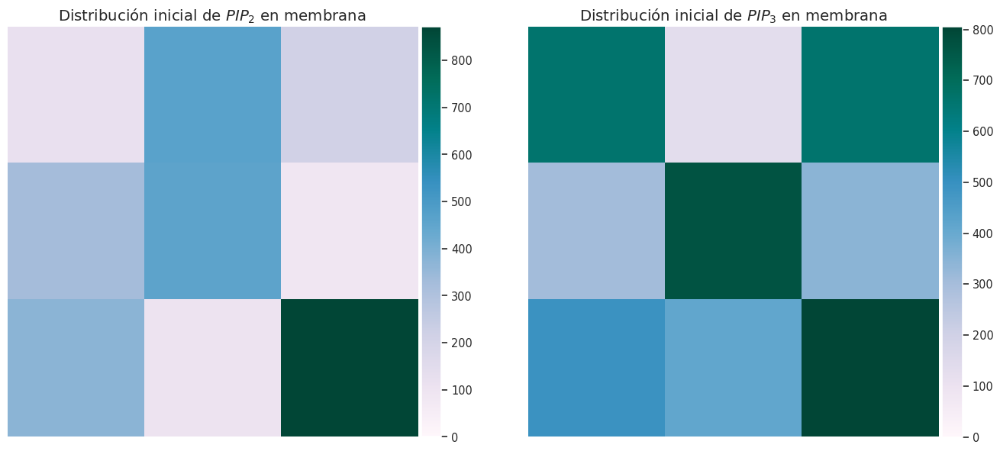

In [129]:
fig,ax = plt.subplots(1,2,dpi=95,figsize=(17,9))

im = ax[0].imshow(evolM[0][4],
               cmap='PuBuGn',
              vmin=0,
              vmax=np.max(evolM[0][4]))

divider = make_axes_locatable(ax[0])
cax = divider.append_axes("right", size="5%", pad=0.05)
cbar = plt.colorbar(im, cax=cax)

ax[0].set_title(r'Distribución inicial de $PIP_{2}$ en membrana',
             fontdict={'fontsize':15,})
ax[0].set_axis_off()

im = ax[1].imshow(evolM[0][5],
               cmap='PuBuGn',
              vmin=0,
              vmax=np.max(evolM[0][5]))

divider = make_axes_locatable(ax[1])
cax = divider.append_axes("right", size="5%", pad=0.05)
cbar = plt.colorbar(im, cax=cax)

ax[1].set_title(r'Distribución inicial de $PIP_{3}$ en membrana',
             fontdict={'fontsize':15,})
ax[1].set_axis_off()

plt.show()

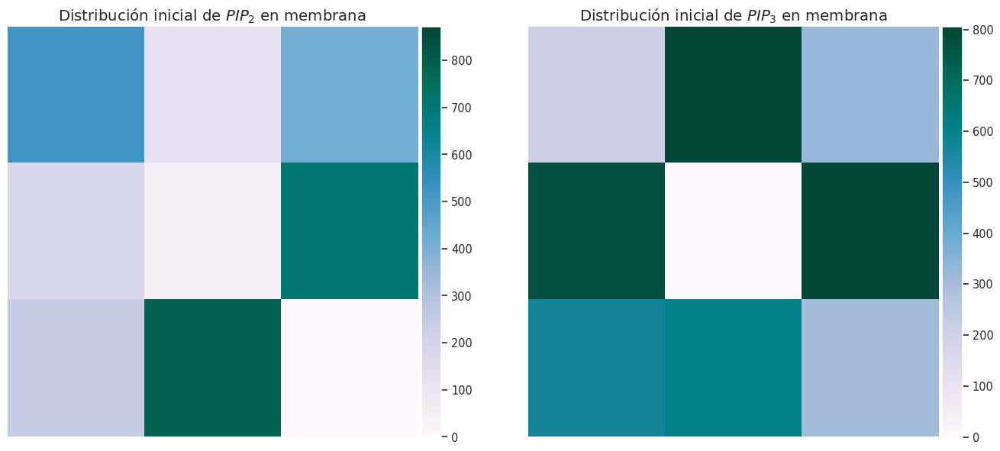

In [130]:
fig,ax = plt.subplots(1,2,dpi=95,figsize=(17,9))

im = ax[0].imshow(evolM[-1][4],
               cmap='PuBuGn',
              vmin=0,
              vmax=np.max(evolM[0][4]))

divider = make_axes_locatable(ax[0])
cax = divider.append_axes("right", size="5%", pad=0.05)
cbar = plt.colorbar(im, cax=cax)

ax[0].set_title(r'Distribución inicial de $PIP_{2}$ en membrana',
             fontdict={'fontsize':15,})
ax[0].set_axis_off()

im = ax[1].imshow(evolM[-1][5],
               cmap='PuBuGn',
              vmin=0,
              vmax=np.max(evolM[0][5]))

divider = make_axes_locatable(ax[1])
cax = divider.append_axes("right", size="5%", pad=0.05)
cbar = plt.colorbar(im, cax=cax)

ax[1].set_title(r'Distribución inicial de $PIP_{3}$ en membrana',
             fontdict={'fontsize':15,})
ax[1].set_axis_off()

plt.show()

In [135]:
len(evolM[::40])

329

In [136]:
fig, ax = plt.subplots(1,1,figsize=(9,8),dpi=93)

img = []

ax.set_axis_off()

im = ax.imshow(evolM[0][4],cmap='PuBuGn',
              vmin=0,
              vmax=np.max(evolM[0][4]))

divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.05)
cbar = plt.colorbar(im, cax=cax)

ax.set_title('Distribución de $PIP_{2}$ en membrana')

for t,m in zip(T[::40],evolM[::40]):
    title = ax.text(0.5,1.05,"T = {:.2f}".format(t), 
                    size=plt.rcParams["axes.titlesize"],
                    ha="center", transform=ax.transAxes, )
    img.append([ax.imshow(m[4],
                          cmap='PuBuGn',
                          vmin=0,
                          vmax=np.max(evolM[0][4]),),title])
    
plt.close()

In [137]:
anim = animation.ArtistAnimation(fig, img, interval=20, blit=True,repeat_delay=0)
#with open("./gifs/pip_2_drift.html", "w") as f:
#    print(anim.to_html5_video(), file=f)

In [138]:
rc('animation', html='jshtml')
HTML(anim.to_jshtml())

In [139]:
fig, ax = plt.subplots(1,1,figsize=(9,8),dpi=93)

img = []

ax.set_axis_off()

im = ax.imshow(evolM[0][5],cmap='PuBuGn',
              vmin=0,
              vmax=np.max(evolM[0][5]))

divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.05)
cbar = plt.colorbar(im, cax=cax)

ax.set_title('Distribución de $PIP_{3}$ en membrana')

for t,m in zip(T[::40],evolM[::40]):
    title = ax.text(0.5,1.05,"T = {:.2f}".format(t), 
                    size=plt.rcParams["axes.titlesize"],
                    ha="center", transform=ax.transAxes, )
    img.append([ax.imshow(m[5],
                          cmap='PuBuGn',
                          vmin=0,
                          vmax=np.max(evolM[0][5]),),title])
    
plt.close()

In [140]:
anim = animation.ArtistAnimation(fig, img, interval=20, blit=True,repeat_delay=0)
#with open("./gifs/pip_2_drift.html", "w") as f:
#    print(anim.to_html5_video(), file=f)

In [141]:
rc('animation', html='jshtml')
HTML(anim.to_jshtml())